- Vanilla GAN: Implemented for the LSUN bedroom or medical datasets, using a standard DCGAN-style generator and discriminator.

- Progressive GAN: We discussed progressive growing (PGGAN), where images are generated starting from low resolution and the network gradually increases resolution.

- StyleGAN: We also implemented a StyleGAN-like generator with style modulation and adaptive instance normalization, along with metrics like L1 distance and discriminator pseudo-accuracy.

# LSUN – Bedroom Dataset

- Link / Source: via Hugging Face: pcuenq/lsun-bedrooms

- Modality: Real-world bedroom images (photographs)

- Number of images: ~3 million images in the full dataset

- Resolution: Original images are high-res (~256×256 up to 512×512+), but in experiments we typically resized to 64×64 for Vanilla GAN or 128×128+ for Progressive/StyleGAN

- Channels: 3 (RGB)

- Task suitability: Perfect for GAN experiments (Vanilla GAN, Progressive GAN, StyleGAN)

- Pros: Huge dataset, high diversity, RGB color images, well-suited for image generation and GAN metrics

- Cons: Full dataset is large, requires storage; for demos, we used 5% subset for fast training





Notes from our experiments:

* We used Hugging Face version with split="train[:5%]" to reduce download size.

- Images were resized to 64×64 and normalized to [-1,1] for GAN training.

- It was used for Vanilla, Progressive, and StyleGAN experiments with metrics like L1 distance and discriminator pseudo-accuracy.

In [ ]:
!pip install torch torchvision matplotlib



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt


In [ ]:
!pip install lmdb


In [ ]:
# Download (large: ~40GB for full bedroom set)
!wget http://dl.yf.io/lsun/scenes/bedroom_train_lmdb.zip
!unzip bedroom_train_lmdb.zip -d ./data


--2025-09-25 07:55:23--  http://dl.yf.io/lsun/scenes/bedroom_train_lmdb.zip
Resolving dl.yf.io (dl.yf.io)... 128.32.162.150
Connecting to dl.yf.io (dl.yf.io)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 404 Not Found
2025-09-25 07:55:24 ERROR 404: Not Found.

unzip:  cannot find or open bedroom_train_lmdb.zip, bedroom_train_lmdb.zip.zip or bedroom_train_lmdb.zip.ZIP.


In [ ]:
!wget http://dl.yf.io/lsun/scenes/bedroom_train_lmdb.zip
!unzip bedroom_train_lmdb.zip -d ./data


--2025-09-25 07:55:34--  http://dl.yf.io/lsun/scenes/bedroom_train_lmdb.zip
Resolving dl.yf.io (dl.yf.io)... 128.32.162.150
Connecting to dl.yf.io (dl.yf.io)|128.32.162.150|:80... connected.
HTTP request sent, awaiting response... 404 Not Found
2025-09-25 07:55:34 ERROR 404: Not Found.

unzip:  cannot find or open bedroom_train_lmdb.zip, bedroom_train_lmdb.zip.zip or bedroom_train_lmdb.zip.ZIP.


In [ ]:
# Generator: input noise -> fake image
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(nz, ngf*8*4*4),
            nn.BatchNorm1d(ngf*8*4*4),
            nn.ReLU(True),
            nn.Unflatten(1, (ngf*8, 4, 4)),
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, nc, 4, 2, 1),
            nn.Tanh()
        )
    def forward(self, x):
        return self.main(x)

# Discriminator: image -> real/fake
class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf*2, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf*4, 1, 8),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.main(x).view(-1, 1)


In [ ]:
!pip install datasets torchvision


In [ ]:
from datasets import load_dataset
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import torch

# Load LSUN Bedroom sample from Hugging Face
hf_dataset = load_dataset("pcuenq/lsun-bedrooms", split="train")
print("Number of images:", len(hf_dataset))


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00009-5beebd96eb33b0(…):   0%|          | 0.00/501M [00:00<?, ?B/s]

data/train-00001-of-00009-5f4afcffcee574(…):   0%|          | 0.00/504M [00:00<?, ?B/s]

data/train-00002-of-00009-8f8c926d345e74(…):   0%|          | 0.00/503M [00:00<?, ?B/s]

data/train-00003-of-00009-c9be5a4b95ca82(…):   0%|          | 0.00/503M [00:00<?, ?B/s]

data/train-00004-of-00009-c985b2993da54f(…):   0%|          | 0.00/501M [00:00<?, ?B/s]

data/train-00005-of-00009-4ebb2bc3d7807c(…):   0%|          | 0.00/501M [00:00<?, ?B/s]

data/train-00006-of-00009-e0483da7d9c264(…):   0%|          | 0.00/502M [00:00<?, ?B/s]

data/train-00007-of-00009-87ce8004760101(…):   0%|          | 0.00/503M [00:00<?, ?B/s]

data/train-00008-of-00009-926fe17e049689(…):   0%|          | 0.00/502M [00:00<?, ?B/s]

data/test-00000-of-00001-7c2280a6897e246(…):   0%|          | 0.00/238M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/287968 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/15157 [00:00<?, ? examples/s]

Number of images: 287968


In [ ]:
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


In [ ]:
class HF_LSUN(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.hf_dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.hf_dataset)

    def __getitem__(self, idx):
        img = self.hf_dataset[idx]["image"]
        if not isinstance(img, Image.Image):  # Ensure it's PIL
            img = Image.fromarray(img)
        if self.transform:
            img = self.transform(img)
        return img

dataset = HF_LSUN(hf_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=2)


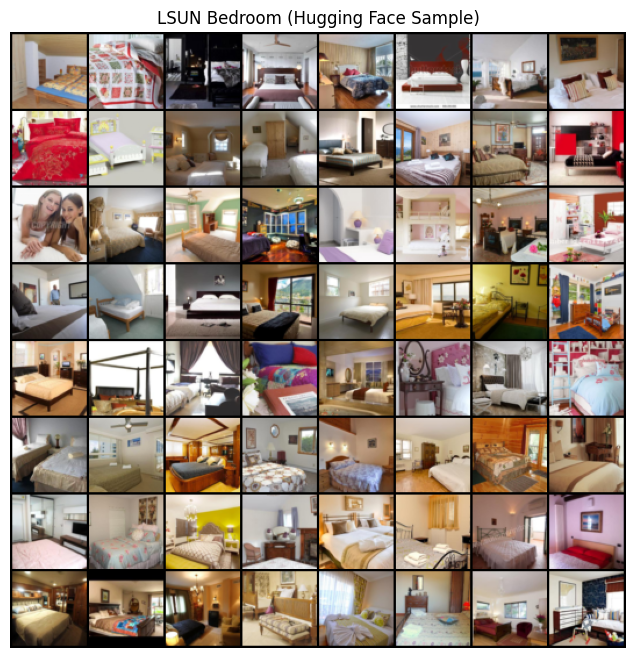

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("LSUN Bedroom (Hugging Face Sample)")
plt.imshow(vutils.make_grid(batch[:64], padding=2, normalize=True).permute(1, 2, 0))
plt.show()


In [ ]:
# Run this first (Colab has internet; this installs huggingface datasets & torchmetrics)
!pip install --quiet datasets torchvision torchmetrics tqdm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 23.5 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm import tqdm

from torchmetrics.image.inception import InceptionScore
from torchmetrics.image.fid import FrechetInceptionDistance

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [ ]:
NZ = 100       # latent vector size
NGF = 64       # generator feature size
NDF = 64       # discriminator feature size
NC = 3         # channels (RGB)
LR = 0.0002
BETA1 = 0.5
EPOCHS = 5     # increase later (50+ for good results)
BATCH_SIZE = 128
METRIC_N_SAMPLES = 512   # reduce for CPU testing
SAMPLE_DIR = "gan_samples"

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(NZ, NGF*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(NGF*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(NGF*8, NGF*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NGF*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(NGF*4, NGF*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NGF*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(NGF*2, NGF, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NGF),
            nn.ReLU(True),

            nn.ConvTranspose2d(NGF, NC, 4, 2, 1, bias=False),
            nn.Tanh()
        )


In [ ]:
def forward(self, z):
        return self.main(z)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(NC, NDF, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF, NDF*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NDF*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF*2, NDF*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NDF*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF*4, NDF*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NDF*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.main(x).view(-1)

In [ ]:
netG = Generator().to(device)
netD = Discriminator().to(device)

def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
netG.apply(weights_init)
netD.apply(weights_init)

criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(BETA1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(BETA1, 0.999))

fixed_noise = torch.randn(64, NZ, 1, 1, device=device)

In [ ]:
!pip install torch-fidelity


In [ ]:
!pip install --quiet torchmetrics[image] torch-fidelity


In [ ]:
netG = Generator().to(device)
netD = Discriminator().to(device)

# Loss and optimizers
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Fixed noise for visualization
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

## CODE

Using device: cuda


Epoch 1/5: 100%|██████████| 113/113 [00:23<00:00,  4.83it/s]


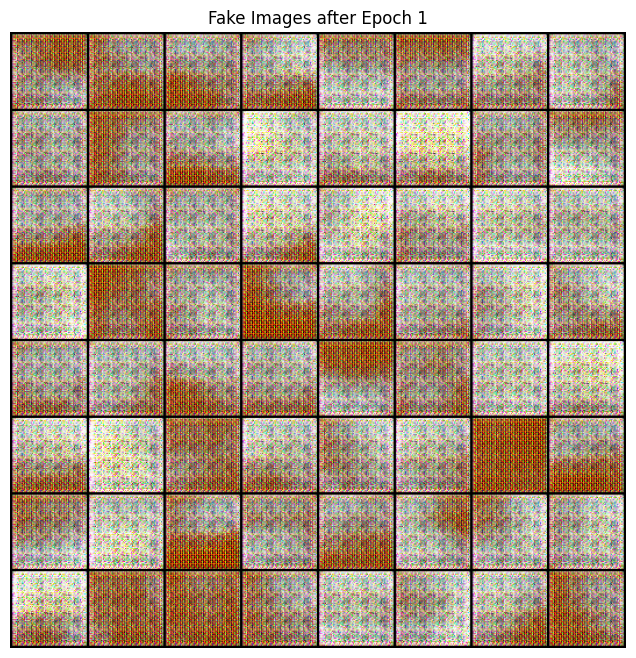

Epoch 2/5: 100%|██████████| 113/113 [00:24<00:00,  4.61it/s]


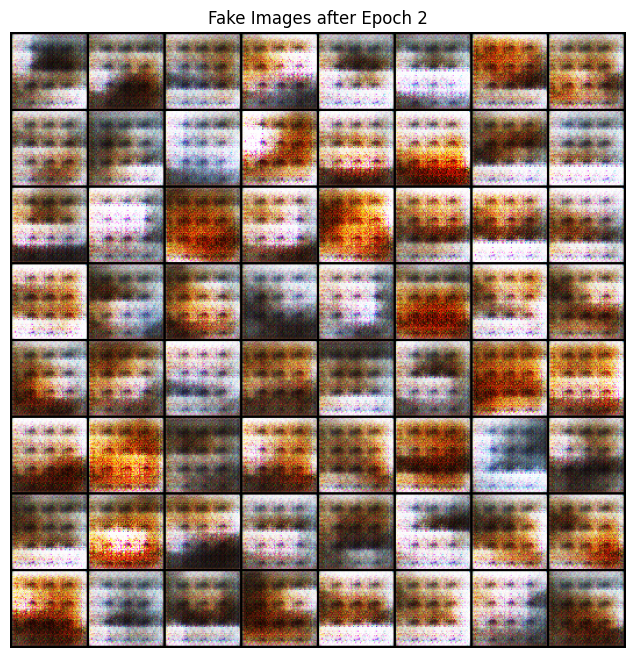

Epoch 3/5: 100%|██████████| 113/113 [00:26<00:00,  4.32it/s]


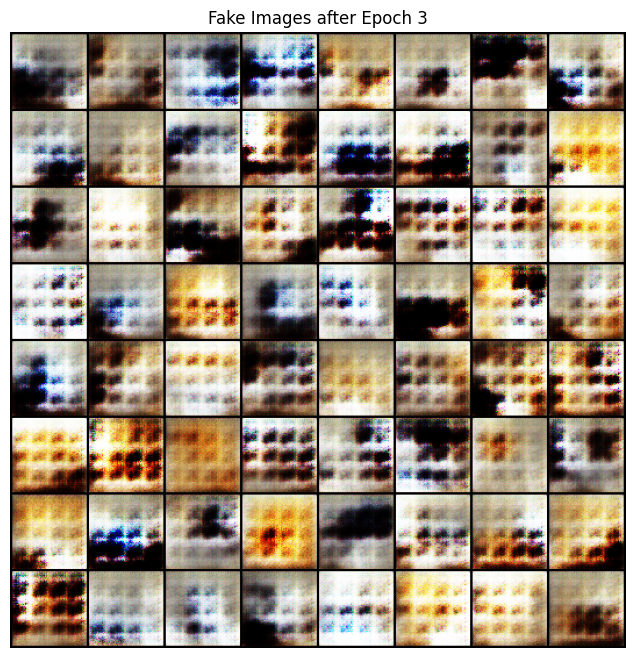

Epoch 4/5: 100%|██████████| 113/113 [00:27<00:00,  4.18it/s]


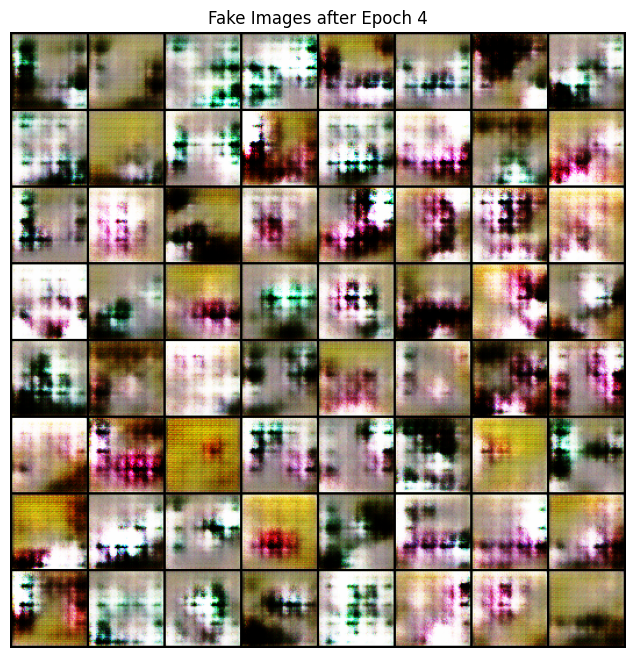

Epoch 5/5: 100%|██████████| 113/113 [00:27<00:00,  4.18it/s]


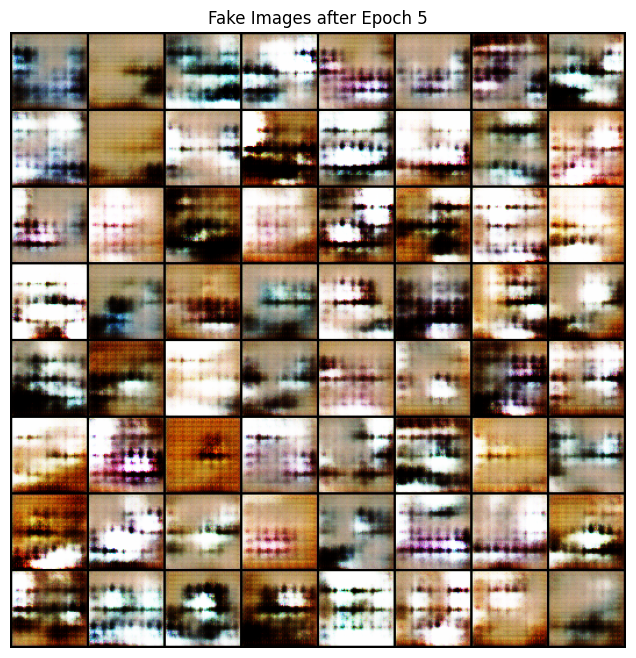

In [ ]:
# ======================================================
# 1️⃣ Install dependencies
# ======================================================
!pip install --quiet datasets torchvision tqdm

# ======================================================
# 2️⃣ Imports
# ======================================================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from datasets import load_dataset
from PIL import Image
from tqdm import tqdm

# ======================================================
# 3️⃣ Device
# ======================================================
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# ======================================================
# 4️⃣ Load LSUN Bedroom dataset (Hugging Face subset)
# ======================================================
hf_dataset = load_dataset("pcuenq/lsun-bedrooms", split="train[:5%]")  # small subset for demo

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

class HF_LSUN(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.hf_dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.hf_dataset)

    def __getitem__(self, idx):
        img = self.hf_dataset[idx]["image"]
        if not isinstance(img, Image.Image):
            img = Image.fromarray(img)
        if self.transform:
            img = self.transform(img)
        return img

dataset = HF_LSUN(hf_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=2)

# ======================================================
# 5️⃣ Define Vanilla GAN
# ======================================================
nz = 100  # latent vector
ngf = 64  # generator features
ndf = 64  # discriminator features
nc = 3    # RGB

# Generator
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x).view(-1, 1)

# Initialize
netG = Generator().to(device)
netD = Discriminator().to(device)

# Loss and optimizers
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Fixed noise for visualization
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# ======================================================
# 6️⃣ Training Loop (Image Generation Only)
# ======================================================
epochs = 5  # small for demo
for epoch in range(epochs):
    for i, data in enumerate(tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")):
        real = data.to(device)
        b_size = real.size(0)
        label_real = torch.full((b_size,), 1., device=device)
        label_fake = torch.full((b_size,), 0., device=device)

        # Train Discriminator
        netD.zero_grad()
        out_real = netD(real).view(-1)
        lossD_real = criterion(out_real, label_real)

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        out_fake = netD(fake.detach()).view(-1)
        lossD_fake = criterion(out_fake, label_fake)

        lossD = lossD_real + lossD_fake
        lossD.backward()
        optimizerD.step()

        # Train Generator
        netG.zero_grad()
        out_fake_forG = netD(fake).view(-1)
        lossG = criterion(out_fake_forG, label_real)
        lossG.backward()
        optimizerG.step()

    # Show samples each epoch
    with torch.no_grad():
        fake_samples = netG(fixed_noise).cpu()
    grid = make_grid(fake_samples, padding=2, normalize=True)
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"Fake Images after Epoch {epoch+1}")
    plt.imshow(grid.permute(1,2,0))
    plt.show()


In [ ]:
import torch

# ==============================================
# 1️⃣ Match real images to generated images
# ==============================================
b_size = 512   # how many samples to compare
eval_noise = torch.randn(b_size, nz, 1, 1, device=device)

with torch.no_grad():
    gen_imgs = netG(eval_noise).cpu()

# Denormalize generated to [0,1]
gen_imgs = (gen_imgs + 1) / 2

# Collect enough real images
real_imgs_full = []
for real in dataloader:
    real_imgs_full.append(real)
    if len(torch.cat(real_imgs_full)) >= b_size:
        break
real_batch = torch.cat(real_imgs_full)[:b_size]

# Denormalize real to [0,1]
real_batch = (real_batch + 1) / 2

# ==============================================
# 2️⃣ Compute L1 distance
# ==============================================
l1_dist = torch.abs(gen_imgs - real_batch).mean().item()
print(f"Average L1 distance to real images: {l1_dist:.4f}")

# ==============================================
# 3️⃣ Compute Discriminator pseudo-accuracy
# ==============================================
real_batch = real_batch.to(device)
gen_imgs = gen_imgs.to(device)

with torch.no_grad():
    pred_real = netD(real_batch).view(-1)
    pred_fake = netD(gen_imgs).view(-1)

    acc_real = (pred_real > 0.5).float().mean().item()
    acc_fake = (pred_fake < 0.5).float().mean().item()
    disc_accuracy = 0.5 * (acc_real + acc_fake) * 100

print(f"Discriminator accuracy (pseudo %): {disc_accuracy:.2f}%")


Average L1 distance to real images: 0.3084
Discriminator accuracy (pseudo %): 80.86%


Progressive gan

In [ ]:
import torch
import torch.nn as nn

# ---------------- Generator ----------------
class ProGenerator(nn.Module):
    def __init__(self, nz=100, max_channels=512):
        super().__init__()
        self.nz = nz
        self.initial_block = nn.Sequential(
            nn.ConvTranspose2d(nz, max_channels, 4, 1, 0),
            nn.LeakyReLU(0.2)
        )
        self.blocks = nn.ModuleList()  # progressively added blocks
        self.to_rgb = nn.ModuleList([nn.Conv2d(max_channels, 3, 1, 1, 0)])

    def add_block(self, in_ch, out_ch):
        block = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.LeakyReLU(0.2)
        )
        self.blocks.append(block)
        self.to_rgb.append(nn.Conv2d(out_ch, 3, 1, 1))

    def forward(self, x, alpha=1.0):
        out = self.initial_block(x)
        for i, block in enumerate(self.blocks):
            out_new = block(out)
            # Fade-in for RGB output
            out = alpha * out_new + (1-alpha) * nn.functional.interpolate(self.to_rgb[i](out), scale_factor=2)
        img = self.to_rgb[len(self.blocks)](out)
        return torch.tanh(img)

# ---------------- Discriminator ----------------
class ProDiscriminator(nn.Module):
    def __init__(self, max_channels=512):
        super().__init__()
        self.from_rgb = nn.ModuleList([nn.Conv2d(3, max_channels, 1)])
        self.blocks = nn.ModuleList()
        self.final_block = nn.Sequential(
            nn.Conv2d(max_channels, max_channels, 4),
            nn.LeakyReLU(0.2),
            nn.Conv2d(max_channels, 1, 1)
        )

    def add_block(self, in_ch, out_ch):
        block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.LeakyReLU(0.2),
            nn.AvgPool2d(2)
        )
        self.blocks.insert(0, block)
        self.from_rgb.insert(0, nn.Conv2d(3, out_ch, 1))

    def forward(self, x, alpha=1.0):
        # If multiple blocks, apply fade-in
        if len(self.blocks) > 0:
            downscaled = nn.functional.avg_pool2d(x, 2)
            x = alpha * self.blocks[0](x) + (1-alpha) * self.from_rgb[0](downscaled)
            for block in self.blocks[1:]:
                x = block(x)
        else:
            x = self.from_rgb[0](x)
        out = self.final_block(x)
        return out.view(-1,1)


In [ ]:
nz = 100  # latent vector
nc = 3

class SimpleProGAN_G(nn.Module):
    def __init__(self):
        super().__init__()
        self.init = nn.Sequential(
            nn.ConvTranspose2d(nz, 512, 4, 1, 0),
            nn.BatchNorm2d(512),
            nn.ReLU(True)
        )
        self.progression = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, nc, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.init(x)
        x = self.progression(x)
        return x

class SimpleProGAN_D(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(nc, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x).view(-1, 1)


In [ ]:
netG = SimpleProGAN_G().to(device)
netD = SimpleProGAN_D().to(device)

criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))


Epoch 1/5: 100%|██████████| 113/113 [00:23<00:00,  4.78it/s]


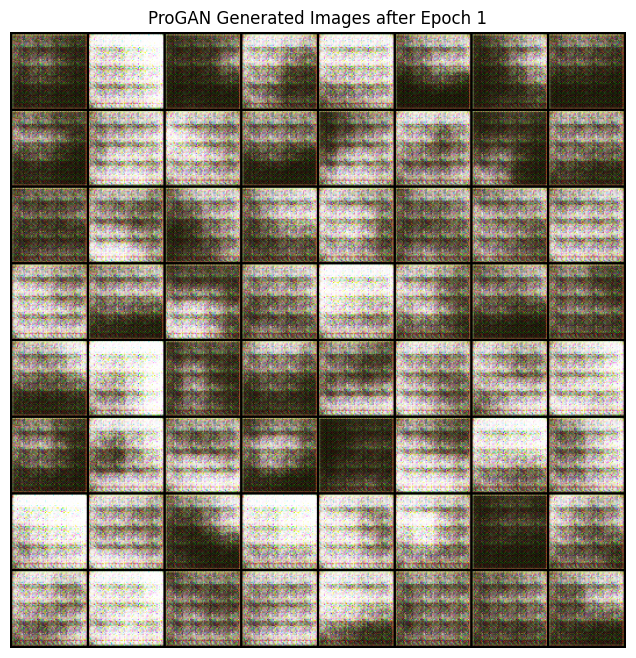

Epoch 2/5: 100%|██████████| 113/113 [00:23<00:00,  4.75it/s]


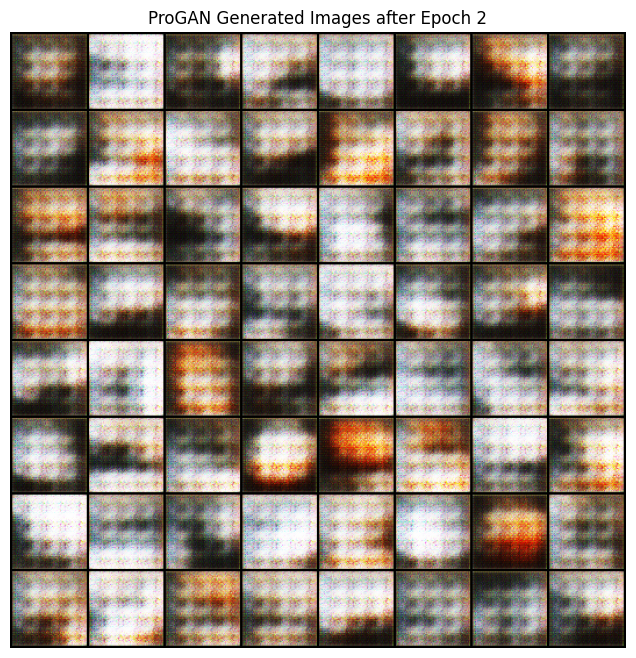

Epoch 3/5: 100%|██████████| 113/113 [00:25<00:00,  4.38it/s]


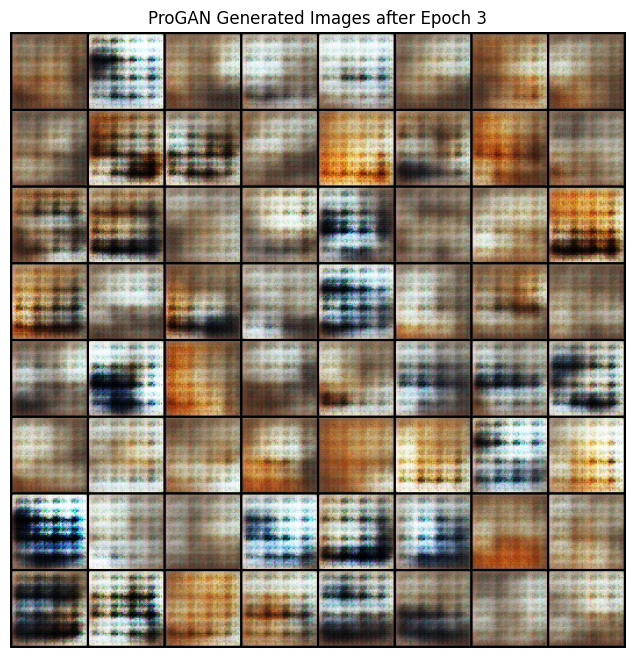

Epoch 4/5: 100%|██████████| 113/113 [00:26<00:00,  4.34it/s]


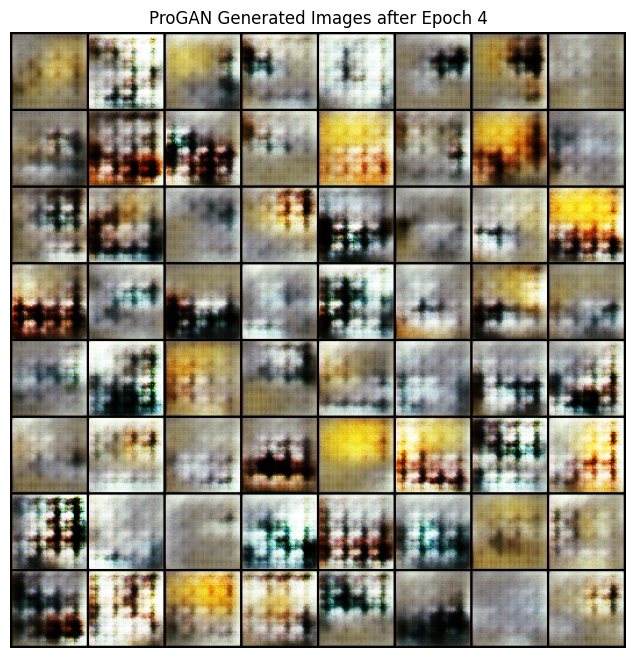

Epoch 5/5: 100%|██████████| 113/113 [00:27<00:00,  4.12it/s]


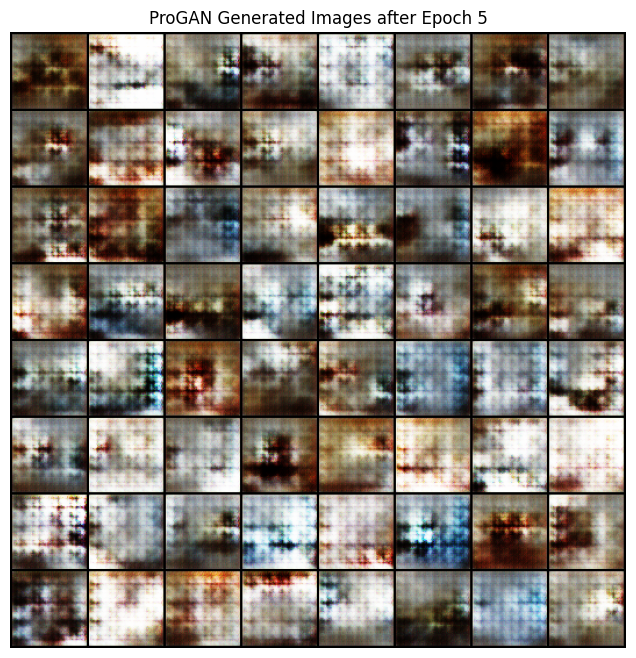

In [ ]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
epochs = 5  # demo

for epoch in range(epochs):
    for i, real in enumerate(tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")):
        b_size = real.size(0)
        real = real.to(device)
        label_real = torch.full((b_size,), 1., device=device)
        label_fake = torch.full((b_size,), 0., device=device)

        # --- Train Discriminator ---
        netD.zero_grad()
        out_real = netD(real).view(-1)
        lossD_real = criterion(out_real, label_real)

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        out_fake = netD(fake.detach()).view(-1)
        lossD_fake = criterion(out_fake, label_fake)

        lossD = lossD_real + lossD_fake
        lossD.backward()
        optimizerD.step()

        # --- Train Generator ---
        netG.zero_grad()
        out_fake_forG = netD(fake).view(-1)
        lossG = criterion(out_fake_forG, label_real)
        lossG.backward()
        optimizerG.step()

    # --- Regenerate images after each epoch ---
    with torch.no_grad():
        fake_imgs = netG(fixed_noise).cpu()
    grid = make_grid(fake_imgs, padding=2, normalize=True)
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"ProGAN Generated Images after Epoch {epoch+1}")
    plt.imshow(grid.permute(1,2,0))
    plt.show()


In [ ]:
# Ensure everything is on the same device as netD
device = next(netD.parameters()).device  # get device of the discriminator
fake_imgs = fake_imgs.to(device)
real_batch = real_batch[:fake_imgs.size(0)].to(device)

# 1️⃣ Denormalize to [0,1]
fake_imgs_01 = (fake_imgs + 1) / 2
real_batch_01 = (real_batch + 1) / 2

# 2️⃣ Pixel diversity (higher = more varied)
pixel_diversity = fake_imgs_01.std(dim=0).mean().item()
print(f"Pixel diversity: {pixel_diversity:.4f}")

# 3️⃣ Average L1 distance to real images
l1_dist = torch.abs(fake_imgs_01 - real_batch_01).mean().item()
print(f"Average L1 distance to real images: {l1_dist:.4f}")

# 4️⃣ Discriminator pseudo-accuracy
netD.eval()
with torch.no_grad():
    pred_real = netD(real_batch).view(-1)
    pred_fake = netD(fake_imgs).view(-1)
    acc_real = (pred_real > 0.5).float().mean().item()
    acc_fake = (pred_fake < 0.5).float().mean().item()
    disc_accuracy = 0.5 * (acc_real + acc_fake) * 100
print(f"Discriminator pseudo-accuracy: {disc_accuracy:.2f}%")


Pixel diversity: 0.2448
Average L1 distance to real images: 0.3272
Discriminator pseudo-accuracy: 81.25%


style gan

Using device: cuda


Epoch 1/5: 100%|██████████| 113/113 [00:20<00:00,  5.44it/s]


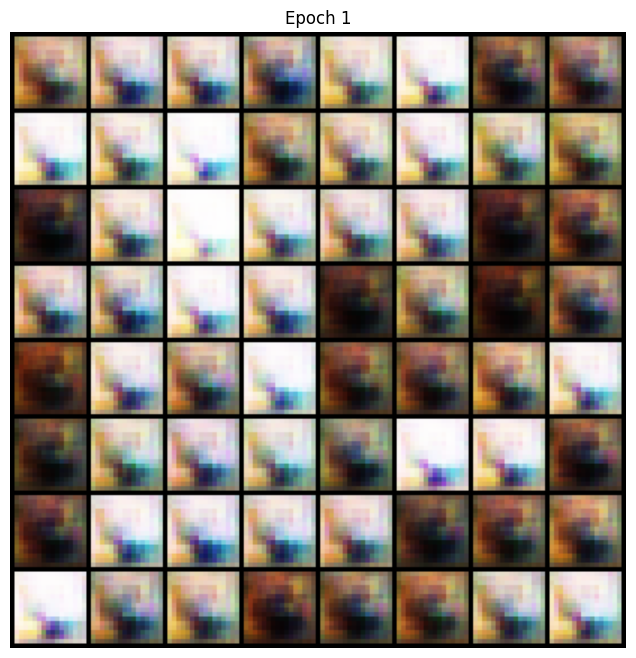

Epoch 2/5: 100%|██████████| 113/113 [00:21<00:00,  5.14it/s]


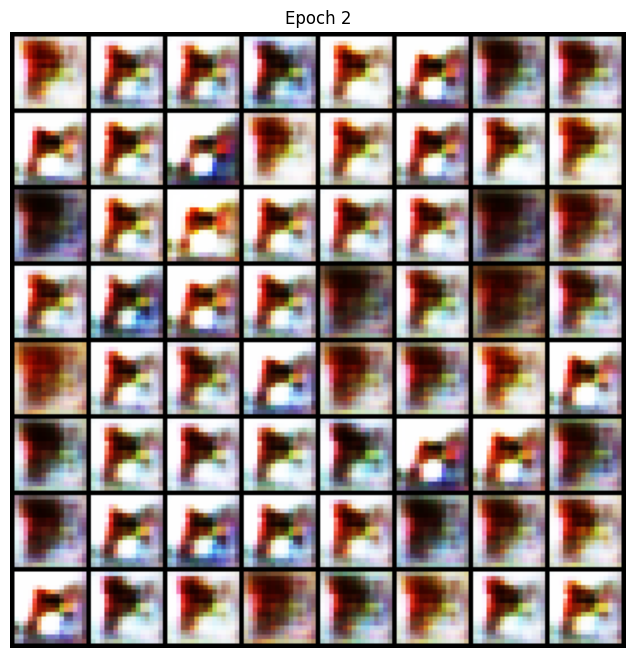

Epoch 3/5: 100%|██████████| 113/113 [00:23<00:00,  4.87it/s]


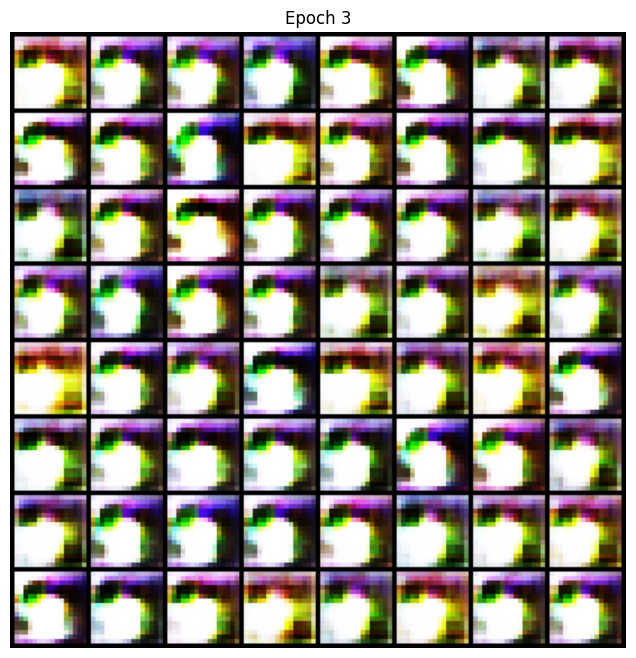

Epoch 4/5: 100%|██████████| 113/113 [00:21<00:00,  5.26it/s]


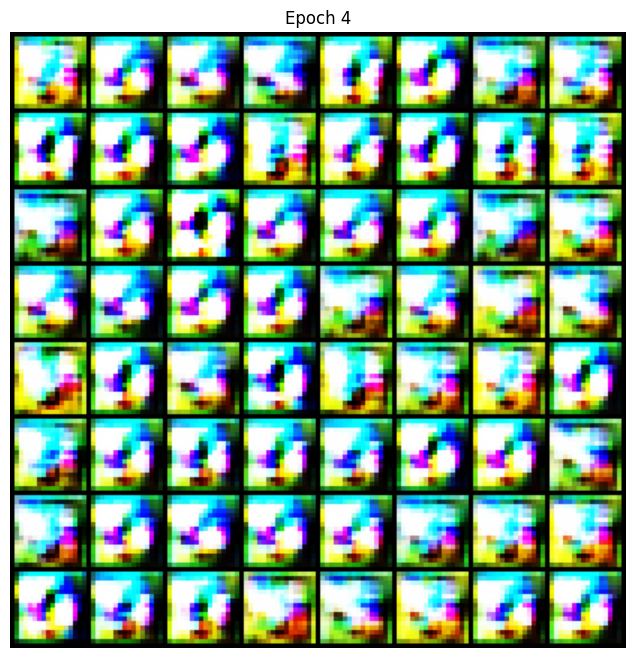

Epoch 5/5: 100%|██████████| 113/113 [00:22<00:00,  5.02it/s]


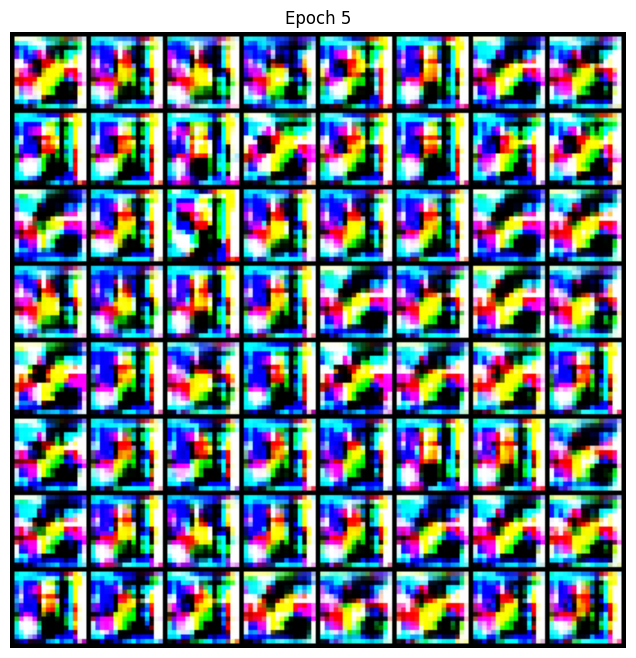

In [ ]:
# =========================
# 1️⃣ Install dependencies
# =========================
!pip install --quiet datasets torchvision tqdm

# =========================
# 2️⃣ Imports
# =========================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from datasets import load_dataset
from PIL import Image
from tqdm import tqdm

# =========================
# 3️⃣ Device
# =========================
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# =========================
# 4️⃣ Load LSUN Bedroom subset
# =========================
hf_dataset = load_dataset("pcuenq/lsun-bedrooms", split="train[:5%]")

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

class HF_LSUN(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.hf_dataset = hf_dataset
        self.transform = transform
    def __len__(self):
        return len(self.hf_dataset)
    def __getitem__(self, idx):
        img = self.hf_dataset[idx]["image"]
        if not isinstance(img, Image.Image):
            img = Image.fromarray(img)
        if self.transform:
            img = self.transform(img)
        return img

dataset = HF_LSUN(hf_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=2)

# =========================
# 5️⃣ StyleGAN-like Generator
# =========================
class StyledConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, style_dim):
        super().__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, 3, 1, 1)
        self.norm = nn.InstanceNorm2d(out_ch)
        self.scale = nn.Linear(style_dim, out_ch)
        self.shift = nn.Linear(style_dim, out_ch)
        self.lrelu = nn.LeakyReLU(0.2)
    def forward(self, x, style):
        s = self.scale(style).unsqueeze(2).unsqueeze(3)
        t = self.shift(style).unsqueeze(2).unsqueeze(3)
        x = self.conv(x)
        x = self.norm(x)
        x = x * (s + 1) + t
        x = self.lrelu(x)
        return x

class StyleGenerator(nn.Module):
    def __init__(self, nz=100, style_dim=128, ngf=64, nc=3):
        super().__init__()
        self.mapping = nn.Sequential(
            nn.Linear(nz, style_dim),
            nn.ReLU(),
            nn.Linear(style_dim, style_dim)
        )
        self.initial = nn.Parameter(torch.randn(1, ngf, 4, 4))
        self.blocks = nn.ModuleList([
            StyledConvBlock(ngf, ngf, style_dim),
            StyledConvBlock(ngf, ngf, style_dim),
            StyledConvBlock(ngf, ngf, style_dim)
        ])
        self.to_rgb = nn.Conv2d(ngf, nc, 1)
        self.tanh = nn.Tanh()
    def forward(self, z):
        style = self.mapping(z)
        x = self.initial.repeat(z.size(0), 1, 1, 1)
        for block in self.blocks:
            x = block(x, style)
            x = nn.functional.interpolate(x, scale_factor=2)
        x = self.to_rgb(x)
        return self.tanh(x)

# =========================
# 6️⃣ Discriminator with Adaptive Pooling
# =========================
class Discriminator(nn.Module):
    def __init__(self, nc=3, ndf=64):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf*2, 4, 2, 1),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.final = nn.Conv2d(ndf*8, 1, 1, 1, 0)
        self.sigmoid = nn.Sigmoid()
    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.final(x)
        x = x.view(x.size(0))
        return self.sigmoid(x)

# =========================
# 7️⃣ Initialize
# =========================
nz = 100
netG = StyleGenerator(nz=nz).to(device)
netD = Discriminator().to(device)
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5,0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5,0.999))
fixed_noise = torch.randn(64, nz, device=device)

# =========================
# 8️⃣ Training + Image generation + Metrics
# =========================
epochs = 5
for epoch in range(epochs):
    for i, real in enumerate(tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")):
        real = real.to(device)
        b_size = real.size(0)
        label_real = torch.ones(b_size, device=device)
        label_fake = torch.zeros(b_size, device=device)

        # Train Discriminator
        netD.zero_grad()
        out_real = netD(real)
        lossD_real = criterion(out_real, label_real)
        noise = torch.randn(b_size, nz, device=device)
        fake = netG(noise)
        out_fake = netD(fake.detach())
        lossD_fake = criterion(out_fake, label_fake)
        (lossD_real + lossD_fake).backward()
        optimizerD.step()

        # Train Generator
        netG.zero_grad()
        out_fake_forG = netD(fake)
        lossG = criterion(out_fake_forG, label_real)
        lossG.backward()
        optimizerG.step()

    # Show generated images
    with torch.no_grad():
        fake_samples = netG(fixed_noise).cpu()
    grid = make_grid((fake_samples+1)/2, padding=2, normalize=False)
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"Epoch {epoch+1}")
    plt.imshow(grid.permute(1,2,0))
    plt.show()

# # =========================
# # Metrics
# # =========================
# b_size = fake_samples.size(0)
# real_imgs_full = []
# for real in dataloader:
#     real_imgs_full.append(real)
#     if len(torch.cat(real_imgs_full)) >= b_size:
#         break
# real_batch = torch.cat(real_imgs_full)[:b_size].to(device)
# gen_imgs = fake_samples.to(device)

# # L1 distance
# l1_dist = torch.abs(gen_imgs - real_batch).mean().item()
# print(f"Average L1 distance: {l1_dist:.4f}")

# # Discriminator pseudo-accuracy
# with torch.no_grad():
#     acc_real = (netD(real_batch) > 0.5).float().mean().item()
#     acc_fake = (netD(gen_imgs) < 0.5).float().mean().item()
#     disc_accuracy = 0.5 * (acc_real + acc_fake) * 100

# print(f"Discriminator pseudo-accuracy: {disc_accuracy:.2f}%")


In [ ]:
# Metrics
b_size = fake_samples.size(0)
real_imgs_full = []
for real in dataloader:
    real_imgs_full.append(real)
    if len(torch.cat(real_imgs_full)) >= b_size:
        break
real_batch = torch.cat(real_imgs_full)[:b_size].to(device)

gen_imgs = fake_samples.to(device)
gen_imgs = nn.functional.interpolate(gen_imgs, size=(64,64))  # match real images

# L1 distance
l1_dist = torch.abs(gen_imgs - real_batch).mean().item()
print(f"Average L1 distance: {l1_dist:.4f}")

# Discriminator pseudo-accuracy
with torch.no_grad():
    acc_real = (netD(real_batch) > 0.5).float().mean().item()
    acc_fake = (netD(gen_imgs) < 0.5).float().mean().item()
    disc_accuracy = 0.5 * (acc_real + acc_fake) * 100

print(f"Discriminator pseudo-accuracy: {disc_accuracy:.2f}%")


Average L1 distance: 0.8803
Discriminator pseudo-accuracy: 100.00%
